# SIT Variability in CMIP6

## Background and Motivation

**Why do we care about SIT variability?**
- Labe et al 2018
    - patterns, etc 
    - lack of observations
- Blanchard Wrigglesworth et al 2011
    - predictability (memory and damping timescales 
    - dynamic contribution
- Bitz et al 1996
    - thermodynamic contribution
- Olonschok et al 2020? 
    - model variability can be wildly different, even if means states are consistent (SIE)
    
We have few but increasing #'s of  observations, so trying to grapple with what our models are telling us is an important first step

**What's new about this work**
- Timeseries filtering: contributions of variability at different scales
- Comparison of SIT variability across a range of model complexities: role of thermodynamic and dynamic contributions

**What this notebook contributes**

In this section, we apply a timeseries decomposition to the entire available CMIP6 archive, in order to better understand how our best global climate models represent the spatial patterns of SIT variability. In particular, we are interested in understanding whether they capture a consistent pattern of change in the location of maximum variability based as a function of timescale. 

## Functions

#### Libraries

In [1]:
import xarray as xr
from functools import partial
import matplotlib.pyplot as plt
import glob
import scipy.signal as signal
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Polygon

In [2]:
from xmip.utils import google_cmip_col
from xmip.preprocessing import combined_preprocessing
from xmip.postprocessing import match_metrics
import dask

ModuleNotFoundError: No module named 'xmip'

#### Data Reading

In [2]:
def detrend_data(data):

    results = data.polyfit(dim='time', deg=1)
    new_data = data - xr.polyval(data.time, results.polyfit_coefficients)

    # new_data = butterworth(anoms, len(anoms.time), 'highpass')

    da = xr.DataArray(new_data,
                      coords=data.coords,
                      dims=data.dims,
                      attrs=data.attrs
                      )
    return da


def get_monthly_anomalies(new_data):

    #new_data = detrend_data(data)

    climat = new_data.groupby('time.month').mean(dim='time')
    anoms = new_data.groupby('time.month') - climat

    return anoms

def convert_coords(lat, lon, og_data, ccrs_grid):
    """ convert data to appropriate coordinates for ccrs plot """
    
    grid = ccrs_grid
    coords = grid.transform_points(ccrs.PlateCarree(), 
                                   np.array(lon), 
                                   np.array(lat))
    
    xs = np.ma.masked_invalid(coords[..., 0])
    ys = np.ma.masked_invalid(coords[..., 1])
    data = np.ma.masked_invalid(og_data)
    data.mask = np.logical_or(data.mask, xs.mask, ys.mask)
    
    xs = xs.filled(0)
    ys = ys.filled(0)
    
    return xs,ys,data

def fashion_space(ax):
    """ set standard design paramaters for hemispheric stereo plots """
    
    ax.set_extent([-180,180,55,90], ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.LAND,facecolor = 'gainsboro', zorder=6)
    ax.gridlines()
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = matplotlib.path.Path(verts * radius + center)
    
    ax.set_boundary(circle, transform=ax.transAxes)
    
def plot_nps(data_array, bounds, cmap):
    """ plot a NorthPolarStereo map """
    
    data = data_array
    lat = data_array.TLAT
    lon = data_array.TLON
    nps = ccrs.NorthPolarStereo()
    
    xs,ys,plot_data=convert_coords(lat, lon, data, nps)
    
    # fig = plt.figure(figsize = (6,6))
    ax = plt.gca() #axes(projection=nps)
    fashion_space(ax)
    # cmap = plt.cm.cubehelix_r
    clevs_label = np.linspace(bounds[0], bounds[1], 6)
    clevs = np.linspace(bounds[0], bounds[1], 16)
    img = ax.contourf(xs, ys, data,clevs, transform=ccrs.NorthPolarStereo(), cmap=cmap, extend = 'both')
    cbar2 = fig.colorbar(img, ax=ax, ticks= clevs_label)

#### Analysis

In [3]:
def markov_2(deseasonalized, lag, delt):

    null, A = lag_linregress_3D(deseasonalized, deseasonalized, lagx=0, lagy=lag-1)
    autocorrelation = A

    h_prime = deseasonalized[1:, :, :]
    h_prime_nm1 = deseasonalized[0:-1, :, :]

    r = -1 * np.log(autocorrelation)

    external = (h_prime - (1 - r*delt)*h_prime_nm1)/delt

    return h_prime, autocorrelation, r, external

def lag_linregress_3D(x, y, lagx=0, lagy=0):
    """ Input: Two xr.Datarrays of any dimensions with the first dim being time. 
        Thus the input data could be a 1D time series, or for example, have three 
        dimensions (time,lat,lon). 
        Datasets can be provided in any order, but note that the regression slope 
        and intercept will be calculated for y with respect to x.
        Output: Covariance, correlation, regression slope and intercept, p-value, 
        and standard error on regression between the two datasets along their 
        aligned time dimension.  
        Lag values can be assigned to either of the data, with lagx shifting x, and
        lagy shifting y, with the specified lag amount. 
    """ 
    #1. Ensure that the data are properly alinged to each other. 
    x,y = xr.align(x,y)
    #2. Add lag information if any, and shift the data accordingly
    if lagx!=0:

        # If x lags y by 1, x must be shifted 1 step backwards. 
        # But as the 'zero-th' value is nonexistant, xr assigns it as invalid 
        # (nan). Hence it needs to be dropped
        # x   = x.shift(time = -lagx) #.dropna(dim='time')
        x   = x.shift(time = -lagx) #.dropna(dim='time')
    
        # Next important step is to re-align the two datasets so that y adjusts
        # to the changed coordinates of x
        x,y = xr.align(x,y)

    if lagy!=0:
        # y   = y.shift(time = -lagy)#.dropna(dim='time')
        y   = y.shift(time = -lagy) #.dropna(dim='time')
        x,y = xr.align(x,y)

    #3. Compute data length, mean and standard deviation along time axis: 
    n = y.notnull().sum(dim='time')
    xmean = x.mean(axis=0)
    ymean = y.mean(axis=0)
    xstd  = x.std(axis=0)
    ystd  = y.std(axis=0)

    #4. Compute covariance along time axis
    cov =  np.sum((x - xmean)*(y - ymean), axis=0)/(n)

    #5. Compute correlation along time axis
    cor = cov/(xstd*ystd)

    return cov, cor

#### Plotting

## Archive Preprocessing

In [5]:
# url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
col = google_cmip_col()

#### Default processing

In [14]:
cesm_models = ["CESM2", "CESM2-WACCM", "CESM2-FV2","CESM2-WACCM-FV2"]
other_models = ["CIESM"]

In [6]:
experiment = ['historical']
timestep = 'SImon'
grid = ['gn']

In [10]:
query = dict(experiment_id=experiment,
             table_id=timestep, 
             # source_id = std_models,
             variable_id=['sithick'],
             grid_label=grid)
cat_thick = col.search(**query)

query = dict(experiment_id=experiment,
             table_id=timestep, 
             # source_id= std_models,
             variable_id=['siconc'],
             grid_label=grid)
cat_conc = col.search(**query)

thick_list = sorted(cat_thick.df['source_id'].unique())
conc_list = sorted(cat_conc.df['source_id'].unique())

thick_set = set(thick_list)
intersection = thick_set.intersection(conc_list)
std_models = sorted(list(intersection))
                    
kwargs = {'zarr_kwargs':{'consolidated': True, 
                         'use_cftime':True},
                         'aggregate':False, 
                         'preprocess':combined_preprocessing}

In [12]:
query = dict(experiment_id=experiment,
             table_id=timestep, 
             source_id= std_models,
             variable_id=['sithick', 'siconc'],
             grid_label=grid)
cat = col.search(**query)

std_output = cat.to_dataset_dict(**kwargs)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


KeyboardInterrupt: 

In [18]:
query = dict(experiment_id=experiment, 
             source_id= std_models,
             variable_id='areacello',
             grid_label=grid
            )
cat = col.search(**query)

print(sorted(cat.df['source_id'].unique()))
kwargs = {'zarr_kwargs':{'consolidated': True, 
                         'use_cftime':True},
                         'aggregate':False, 
                         'preprocess':combined_preprocessing}
std_area = cat.to_dataset_dict(**kwargs)

['ACCESS-CM2', 'ACCESS-ESM1-5', 'CNRM-CM6-1-HR', 'CNRM-ESM2-1', 'CanESM5', 'EC-Earth3', 'EC-Earth3-Veg', 'EC-Earth3-Veg-LR', 'GFDL-CM4', 'GFDL-ESM4', 'HadGEM3-GC31-LL', 'IPSL-CM5A2-INCA', 'IPSL-CM6A-LR', 'MIROC-ES2L', 'MIROC6', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'NorCPM1', 'SAM0-UNICON', 'UKESM1-0-LL']

--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [20]:
weighted = match_metrics(std_sithick, std_area, ['areacello'], print_statistics=True)

Processed 24 datasets.
Exact matches:{'areacello': 0}
Other matches:{'areacello': 24}
No match found:{'areacello': 0}


In [21]:
weighted_filtered = {k:ds for k,ds in weighted.items() if 'areacello' in ds.variables}

In [22]:
effective = match_metrics(std_sithick, std_siconc, ['siconc'], print_statistics=True)

ValueError: CMIP.EC-Earth-Consortium.EC-Earth3-Veg.piControl.r1i1p1f1.SImon.gn.none.sithick:`metric` dimensions ['time:24000'] do not match `ds` ['time:6000'].

#### Specialized processing

In [13]:
from xmip.preprocessing import rename_cmip6, promote_empty_dims, broadcast_lonlat, replace_x_y_nominal_lat_lon,correct_lon,correct_coordinates,parse_lon_lat_bounds,maybe_convert_vertex_to_bounds, correct_units   

In [14]:
def cesm_processing(ds):
    ds = ds.copy()
    ds = rename_cmip6(ds)
    ds = promote_empty_dims(ds)
    ds = broadcast_lonlat(ds)
    # ds = replace_x_y_nominal_lat_lon(ds)
    ds = correct_lon(ds)
    ds = correct_coordinates(ds)
    ds = parse_lon_lat_bounds(ds)
    ds = maybe_convert_vertex_to_bounds(ds)
    ds = correct_units(ds)
    return ds

##### CESM

In [15]:
query = dict(experiment_id=experiment,
             source_id=cesm_models,
             variable_id='sithick',
             grid_label=grid
            )
cat_sithick = col.search(**query)

In [16]:
query = dict(experiment_id=experiment,
             # table_id='SImon', 
             source_id=cesm_models,
             variable_id='siconc',
             grid_label=grid
            )
cat_siconc = col.search(**query)

In [17]:
query = dict(experiment_id=experiment,
             source_id=cesm_models,
             variable_id='areacello',
             grid_label=grid
            )
cat_area = col.search(**query)

In [18]:
# pass the preprocessing directly
with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    cesm_sithick = cat_sithick.to_dataset_dict(zarr_kwargs={'consolidated': True, 
                                                             'use_cftime':True},
                                                aggregate=False,
                                                preprocess=cesm_processing)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [19]:
# pass the preprocessing directly
with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    cesm_siconc = cat_siconc.to_dataset_dict(zarr_kwargs={'consolidated': True,
                                                          'use_cftime':True},
                                             aggregate=False,
                                             preprocess=cesm_processing)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [20]:
# pass the preprocessing directly
with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    cesm_area = cat_area.to_dataset_dict(zarr_kwargs={'consolidated': True, 
                                                      'use_cftime':True},
                                         aggregate=False,
                                         preprocess=cesm_processing)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [21]:
cesm_matched= match_metrics(cesm_sithick, cesm_area, ['areacello'],print_statistics =True)
cesm_filtered = {k:ds for k,ds in cesm_matched.items() if 'areacello' in ds.variables}

Processed 4 datasets.
Exact matches:{'areacello': 0}
Other matches:{'areacello': 4}
No match found:{'areacello': 0}


##### CIESM

In [22]:
def other_processing(ds):
    ds = ds.copy()
    ds = rename_cmip6(ds)
    ds = promote_empty_dims(ds)
    ds = broadcast_lonlat(ds)
    ds = replace_x_y_nominal_lat_lon(ds)
    ds = correct_lon(ds)
    ds = correct_coordinates(ds)
    ds = parse_lon_lat_bounds(ds)
    # ds = maybe_convert_vertex_to_bounds(ds)
    ds = correct_units(ds)
    return ds

In [23]:
query = dict(experiment_id=experiment,
             # table_id='SImon', 
             source_id=other_models,
             variable_id='sithick',
             grid_label=grid
            )
cat_other_sithick = col.search(**query)

In [24]:
query = dict(experiment_id=experiment,
             source_id=other_models,
             variable_id='siconc',
             grid_label=grid
            )
cat_other_siconc = col.search(**query)

In [25]:
query = dict(experiment_id=experiment,
             # table_id='SImon', 
             source_id=other_models,
             variable_id='areacello',
             grid_label=grid
            )
cat_other_area = col.search(**query)

In [26]:
# pass the preprocessing directly
with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    other_sithick = cat_other_sithick.to_dataset_dict(zarr_kwargs={'consolidated': True,
                                                                'use_cftime':True},
                                                   aggregate=False,
                                                   preprocess=other_processing)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [27]:
# pass the preprocessing directly
with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    other_siconc = cat_other_siconc.to_dataset_dict(zarr_kwargs={'consolidated': True, 
                                                                    'use_cftime':True},
                                                       aggregate=False,
                                                       preprocess=other_processing)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [28]:
with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    other_area = cat_other_area.to_dataset_dict(zarr_kwargs={'consolidated': True, 
                                                                  'use_cftime':True},
                                                     aggregate=False,
                                                     preprocess=other_processing)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [29]:
other_matched = match_metrics(other_sithick, other_area, ['areacello'],print_statistics =True)
other_filtered = {k:ds for k,ds in other_matched.items() if 'areacello' in ds.variables}

Processed 1 datasets.
Exact matches:{'areacello': 0}
Other matches:{'areacello': 1}
No match found:{'areacello': 0}


In [37]:
other_matched

{'CMIP.THU.CIESM.piControl.r1i1p1f1.SImon.sithick.gn.gs://cmip6/CMIP6/CMIP/THU/CIESM/piControl/r1i1p1f1/SImon/sithick/gn/v20200420/.nan.20200420': <xarray.Dataset>
 Dimensions:        (time: 6000, y: 384, x: 320, vertex: 2)
 Coordinates:
     lat            (y, x) float32 dask.array<chunksize=(384, 320), meta=np.ndarray>
     lon            (y, x) float32 dask.array<chunksize=(384, 320), meta=np.ndarray>
   * time           (time) object 0001-01-16 12:00:00 ... 0500-12-16 12:00:00
     time_bounds    (time) object dask.array<chunksize=(6000,), meta=np.ndarray>
     lat_verticies  (y, x, vertex) float32 dask.array<chunksize=(384, 320, 2), meta=np.ndarray>
     lon_verticies  (y, x, vertex) float32 dask.array<chunksize=(384, 320, 2), meta=np.ndarray>
   * y              (y) float64 -79.22 -78.69 -78.15 -77.62 ... 89.11 89.66 89.71
   * x              (x) float64 1.062 2.187 3.312 4.437 ... 357.7 358.8 359.9
   * vertex         (vertex) int64 0 1
     areacello      (y, x) float32 dask.ar

## Analysis

Area weight for the line plots and for the timeseries filtering analysis, if looking at pan_Arctic means! For the spatial variability and the scatter plots, h_eff is fine.

The key is whether you want to think about mean thickness per grid cell, or some regional/pan-Arctic mean or sum. 

### Historical Area-weighted SIT 

In [30]:
names = np.concatenate((cat.df['source_id'].unique(),cat_area.df['source_id'].unique(),cat_other_area.df['source_id'].unique()))

KeyboardInterrupt: 

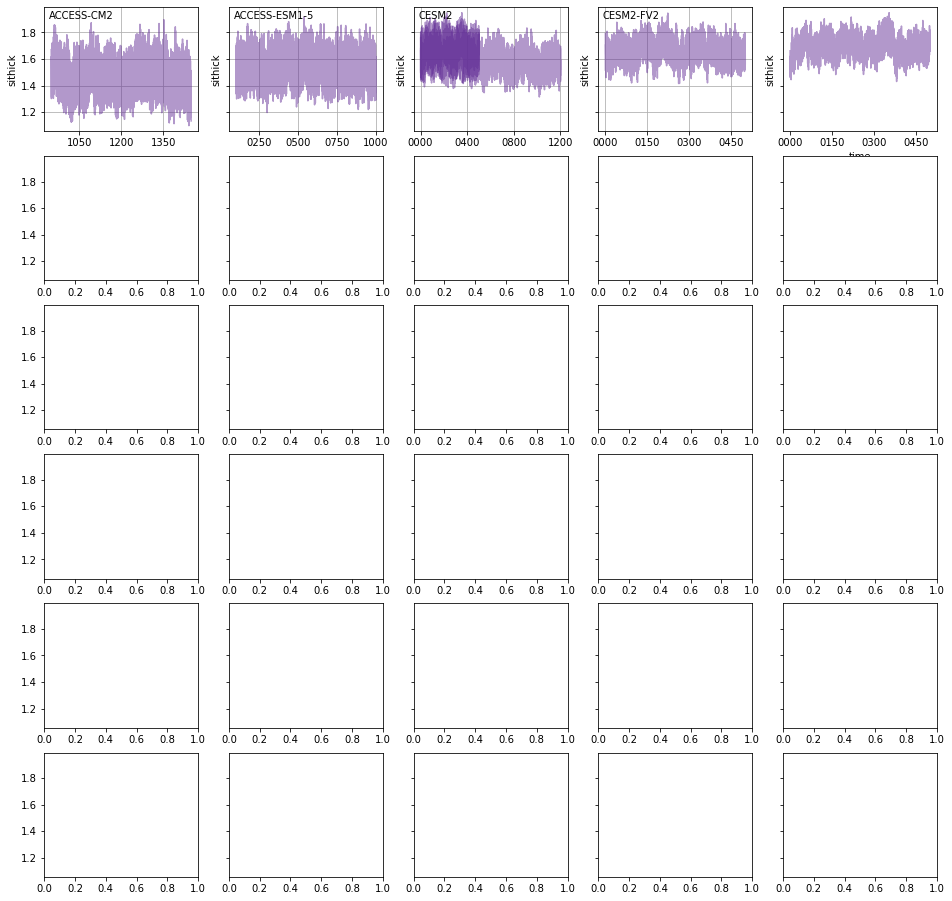

In [31]:
matched = {**cesm_filtered, **matched_filtered, **other_filtered}
models = np.sort(names)
fig, axarr = plt.subplots(ncols=5, nrows=6, figsize=[16, 16], sharey=True)
for model, ax in zip(models, axarr.flat):
    ddict_model = {k:ds for k,ds in matched.items() if model in k}
    for i, ds in enumerate(ddict_model.values()):
        pass
        # calculate the area weighted mean surface ocean temperature
        da = ds.sithick.weighted(ds.areacello.fillna(0)).mean(['x','y']).squeeze().load()
        # resample to 3month averages
        da = da.resample(time='3MS').mean()
        da.plot(ax=ax, color='rebeccapurple', label=ds.attrs['variant_label'], alpha=0.5)
        da.mean
    ax.text(0.03,0.97,model,ha='left',va='top', transform=ax.transAxes)
    ax.set_xlabel('')
    ax.grid()
# fig.subplots_adjust(hspace=0, wspace=0)

In [33]:
matched.keys()

dict_keys(['CMIP.NCAR.CESM2-FV2.piControl.r1i1p1f1.SImon.sithick.gn.gs://cmip6/CMIP6/CMIP/NCAR/CESM2-FV2/piControl/r1i1p1f1/SImon/sithick/gn/v20191120/.nan.20191120', 'CMIP.NCAR.CESM2-WACCM.piControl.r1i1p1f1.SImon.sithick.gn.gs://cmip6/CMIP6/CMIP/NCAR/CESM2-WACCM/piControl/r1i1p1f1/SImon/sithick/gn/v20190320/.nan.20190320', 'CMIP.NCAR.CESM2.piControl.r1i1p1f1.SImon.sithick.gn.gs://cmip6/CMIP6/CMIP/NCAR/CESM2/piControl/r1i1p1f1/SImon/sithick/gn/v20190320/.nan.20190320', 'CMIP.NCAR.CESM2-WACCM-FV2.piControl.r1i1p1f1.SImon.sithick.gn.gs://cmip6/CMIP6/CMIP/NCAR/CESM2-WACCM-FV2/piControl/r1i1p1f1/SImon/sithick/gn/v20191120/.nan.20191120', 'CMIP.CCCma.CanESM5.piControl.r1i1p2f1.SImon.sithick.gn.gs://cmip6/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p2f1/SImon/sithick/gn/v20190429/.nan.20190429', 'CMIP.IPSL.IPSL-CM6A-LR.piControl.r1i2p1f1.SImon.sithick.gn.gs://cmip6/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/piControl/r1i2p1f1/SImon/sithick/gn/v20190319/.nan.20190319', 'CMIP.MOHC.HadGEM3-GC31-LL.piControl.r1i1

In [36]:
for key in matched.keys():
    print(matched[key])

<xarray.Dataset>
Dimensions:      (time: 6000, y: 384, x: 320, nvertices: 4, bnds: 2)
Coordinates:
  * x            (x) int32 1 2 3 4 5 6 7 8 9 ... 313 314 315 316 317 318 319 320
  * y            (y) int32 1 2 3 4 5 6 7 8 9 ... 377 378 379 380 381 382 383 384
    lat          (y, x) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    lat_bounds   (y, x, nvertices) float32 dask.array<chunksize=(384, 320, 4), meta=np.ndarray>
    lon          (y, x) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    lon_bounds   (y, x, nvertices) float32 dask.array<chunksize=(384, 320, 4), meta=np.ndarray>
  * time         (time) object 0001-01-15 12:00:00 ... 0500-12-15 12:00:00
    time_bounds  (time, bnds) object dask.array<chunksize=(6000, 2), meta=np.ndarray>
  * nvertices    (nvertices) int64 0 1 2 3
  * bnds         (bnds) int64 0 1
    areacello    (y, x) float32 dask.array<chunksize=(384, 320), meta=np.ndarray>
Data variables:
    sithick      (time, y, x) float32 dask.arra

### Spatial Variability of Filtered Model Anomalies

In [8]:
inter = 12
nyquist = 1/2
nints = inter*10
cutoff = 1/nints*1/nyquist
decadal_sos = signal.butter(4, cutoff, 'lp', output='sos')
ann2dec_sos = signal.butter(4, [1/(inter*10) * 2, 1/(inter*1.5) * 2], 'bp', output='sos')
annual_sos = signal.butter(4, [1/(inter*1.5) * 2, 1/(inter*0.5) * 2], 'bp', output='sos')
s2s_sos = signal.butter(4, 1/(inter*0.5) * 2, 'hp', output='sos')

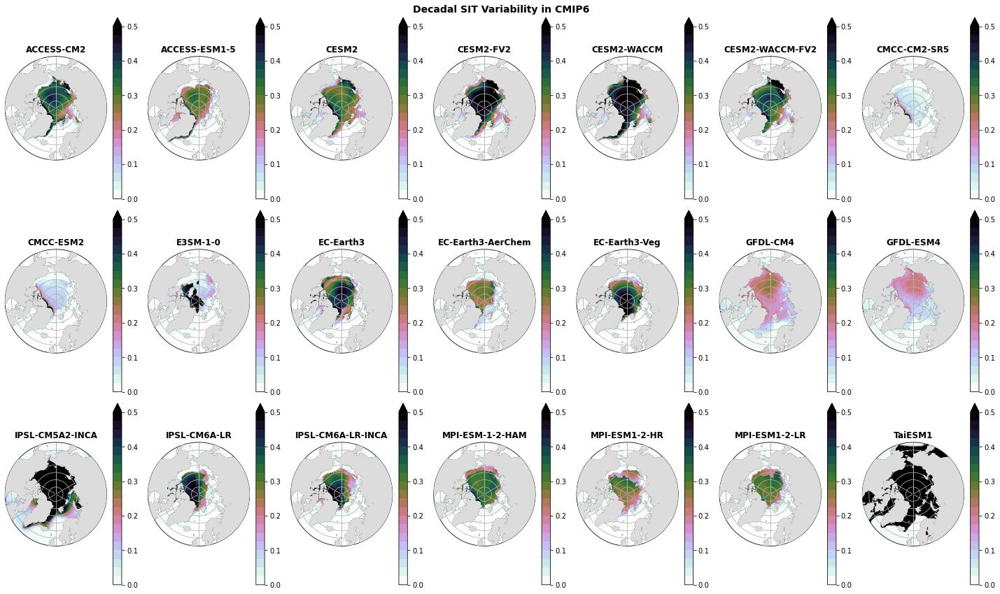

In [11]:
count = 0
count1 = 0
count2 = 0

fig, axes = plt.subplots(nrows=3, ncols=7,
                         figsize=(20,12),
                         subplot_kw={'projection': ccrs.NorthPolarStereo()})

for case in case_list:
    ax = axes[count1][count2]

    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()

    decadal_filtered = xr.apply_ufunc(partial(signal.sosfilt, decadal_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    decadal_filtered.to_netcdf(case+'_decadal.nc')

    fashion_space(ax)

    upper = 0.5 #decadal_filtered.std(dim='time').max().values*2/3
    # base_upper = 0.5

    # if base_upper > upper:
    #     upper = base_upper

    xs, ys, data_to_plot = convert_coords(decadal_filtered.lat, decadal_filtered.lon, decadal_filtered.std(dim='time'), ccrs.NorthPolarStereo())
    cmap = plt.cm.cubehelix_r
    clevs_label = np.linspace(0, upper, 6)
    clevs = np.linspace(0, upper, 21)
    img = ax.contourf(xs, ys, data_to_plot, clevs, transform=ccrs.NorthPolarStereo(), cmap=cmap, extend = 'max')
    cbar2 = fig.colorbar(img, ax=ax, ticks= clevs_label)
    ax.set_title(case, fontweight='bold', fontsize=12)

    count += 1
    count2 += 1
    if count2 > 6:
        count2 = 0
        count1 += 1

plt.suptitle('Decadal SIT Variability in CMIP6', fontweight='bold', fontsize=14)
plt.tight_layout()

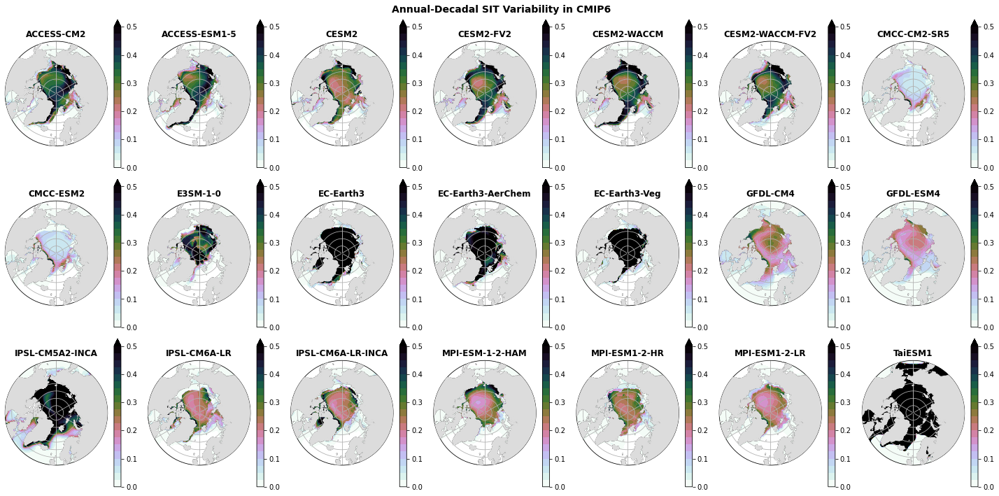

In [13]:
count = 0
count1 = 0
count2 = 0

fig, axes = plt.subplots(nrows=3, ncols=7,
                         figsize=(20,10),
                         subplot_kw={'projection': ccrs.NorthPolarStereo()})

for case in case_list:
    ax = axes[count1][count2]

    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()

    ann2dec_filtered = xr.apply_ufunc(partial(signal.sosfilt, ann2dec_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    ann2dec_filtered.to_netcdf(case+'_ann2dec.nc')

    fashion_space(ax)

    upper = 0.5 #annual_filtered.std(dim='time').max().values*2/3
#     base_upper = 0.5

#     if base_upper > upper:
#         upper = base_upper

    xs, ys, data_to_plot = convert_coords(ann2dec_filtered.lat, ann2dec_filtered.lon, ann2dec_filtered.std(dim='time'), ccrs.NorthPolarStereo())
    cmap = plt.cm.cubehelix_r
    clevs_label = np.linspace(0, upper, 6)
    clevs = np.linspace(0, upper, 21)
    img = ax.contourf(xs, ys, data_to_plot, clevs, transform=ccrs.NorthPolarStereo(), cmap=cmap, extend = 'max')
    cbar2 = fig.colorbar(img, ax=ax, ticks= clevs_label)
    ax.set_title(case, fontweight='bold', fontsize=12)

    count += 1
    count2 += 1
    if count2 > 6:
        count2 = 0
        count1 += 1

plt.suptitle('Annual-Decadal SIT Variability in CMIP6', fontweight='bold', fontsize=14)
plt.tight_layout()

In [14]:
from functools import partial

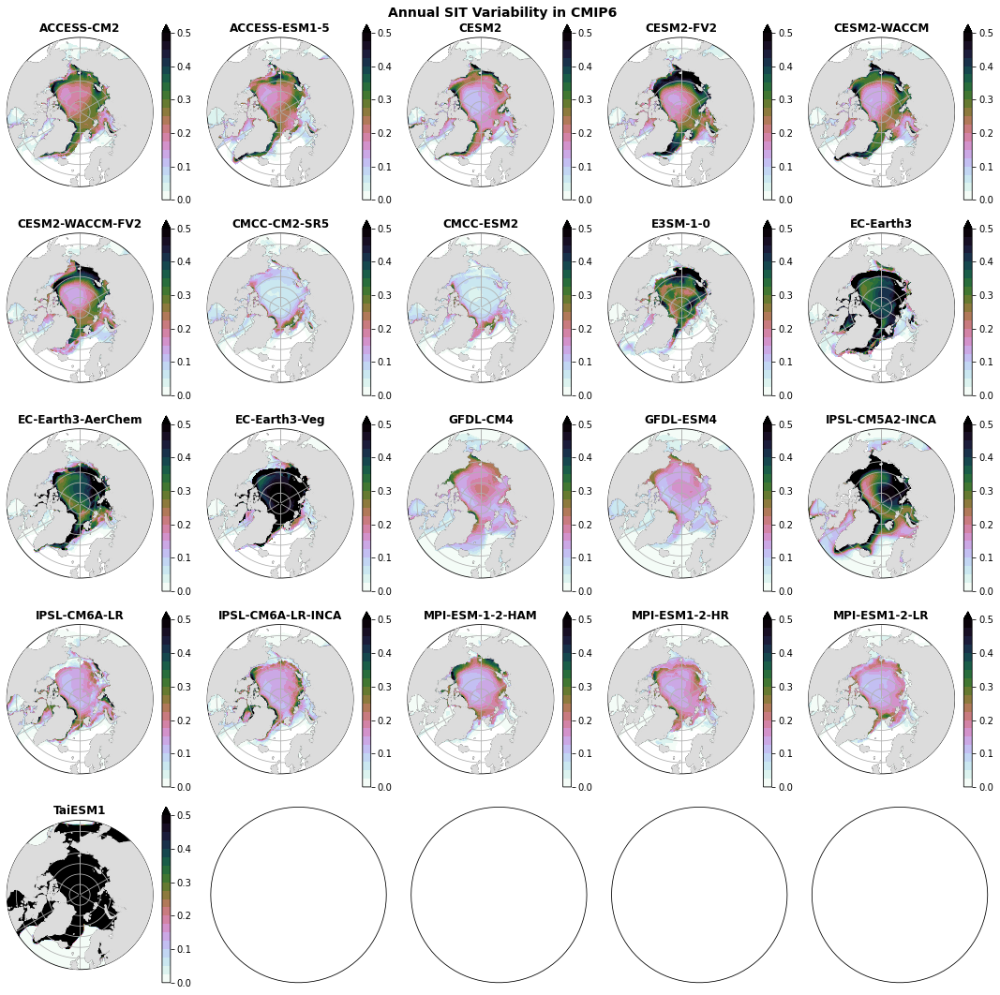

In [14]:
count = 0
count1 = 0
count2 = 0

fig, axes = plt.subplots(nrows=5, ncols=5,
                         figsize=(15, 15),
                         subplot_kw={'projection': ccrs.NorthPolarStereo()})

for case in case_list:
    ax = axes[count1][count2]

    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()

    annual_filtered = xr.apply_ufunc(partial(signal.sosfilt, annual_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    annual_filtered.to_netcdf(case+'_annual.nc')

    fashion_space(ax)

    upper = 0.5 #annual_filtered.std(dim='time').max().values*2/3
#     base_upper = 0.5

#     if base_upper > upper:
#         upper = base_upper

    xs, ys, data_to_plot = convert_coords(annual_filtered.lat, annual_filtered.lon, annual_filtered.std(dim='time'), ccrs.NorthPolarStereo())
    cmap = plt.cm.cubehelix_r
    clevs_label = np.linspace(0, upper, 6)
    clevs = np.linspace(0, upper, 21)
    img = ax.contourf(xs, ys, data_to_plot, clevs, transform=ccrs.NorthPolarStereo(), cmap=cmap, extend = 'max')
    cbar2 = fig.colorbar(img, ax=ax, ticks= clevs_label)
    ax.set_title(case, fontweight='bold', fontsize=12)

    count += 1
    count2 += 1
    if count2 > 4:
        count2 = 0
        count1 += 1

plt.suptitle('Annual SIT Variability in CMIP6', fontweight='bold', fontsize=14)
plt.tight_layout()

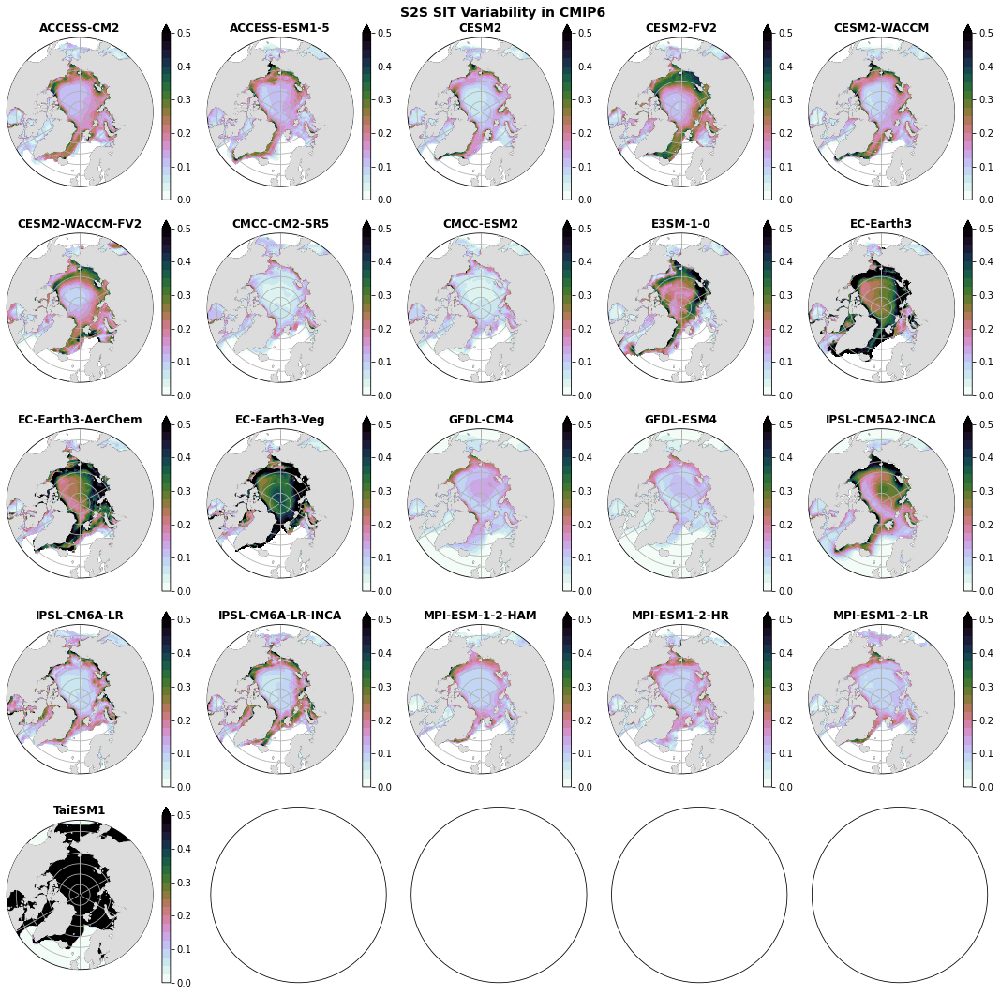

In [15]:
count = 0
count1 = 0
count2 = 0

fig, axes = plt.subplots(nrows=5, ncols=5,
                         figsize=(15, 15),
                         subplot_kw={'projection': ccrs.NorthPolarStereo()})

for case in case_list:
    ax = axes[count1][count2]

    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()

    s2s_filtered = xr.apply_ufunc(partial(signal.sosfilt, s2s_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    s2s_filtered.to_netcdf(case+'_s2s.nc')

    fashion_space(ax)

    upper = 0.5 #annual_filtered.std(dim='time').max().values*2/3
#     base_upper = 0.5

#     if base_upper > upper:
#         upper = base_upper

    xs, ys, data_to_plot = convert_coords(s2s_filtered.lat, s2s_filtered.lon, s2s_filtered.std(dim='time'), ccrs.NorthPolarStereo())
    cmap = plt.cm.cubehelix_r
    clevs_label = np.linspace(0, upper, 6)
    clevs = np.linspace(0, upper, 21)
    img = ax.contourf(xs, ys, data_to_plot, clevs, transform=ccrs.NorthPolarStereo(), cmap=cmap, extend = 'max')
    cbar2 = fig.colorbar(img, ax=ax, ticks= clevs_label)
    ax.set_title(case, fontweight='bold', fontsize=12)

    count += 1
    count2 += 1
    if count2 > 4:
        count2 = 0
        count1 += 1

plt.suptitle('S2S SIT Variability in CMIP6', fontweight='bold', fontsize=14)
plt.tight_layout()

### Model Percent Contributions to Total Variance

/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


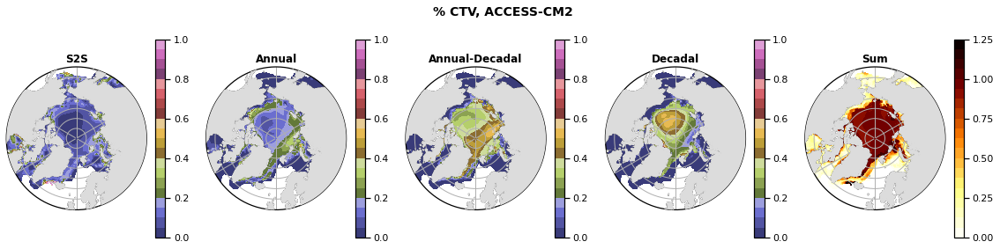

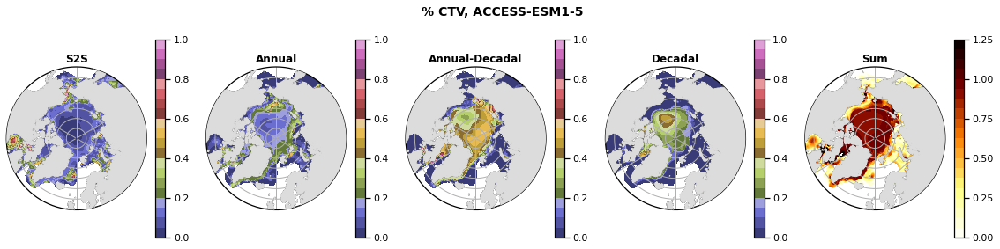

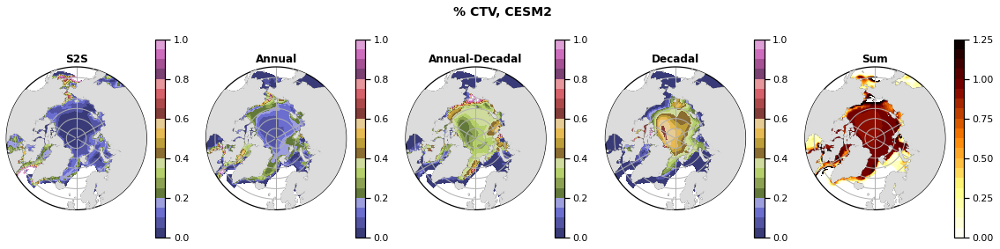

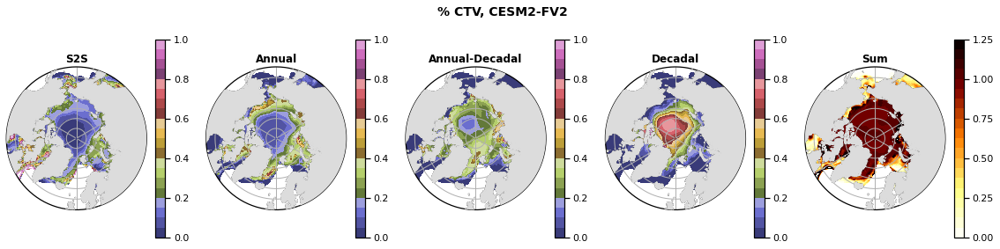

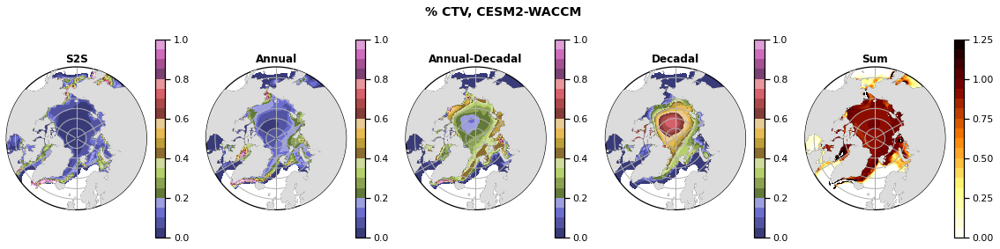

...

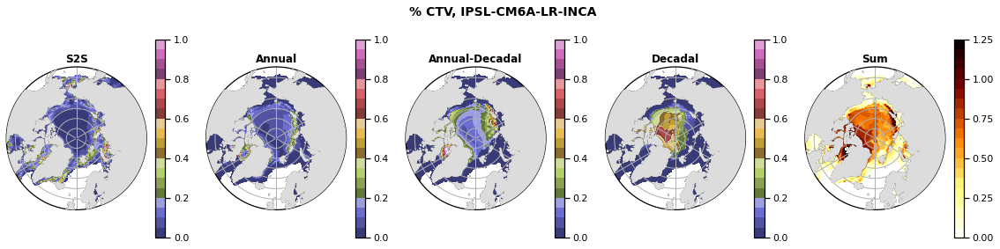

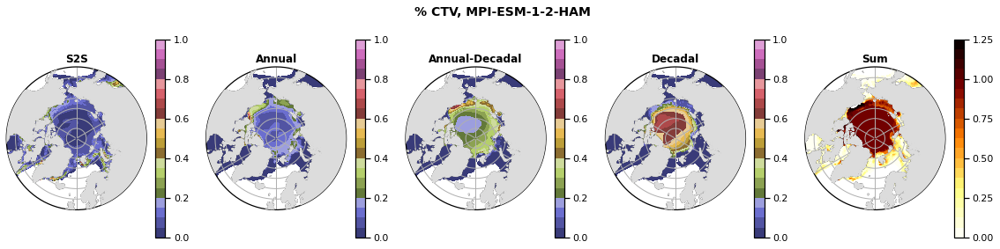

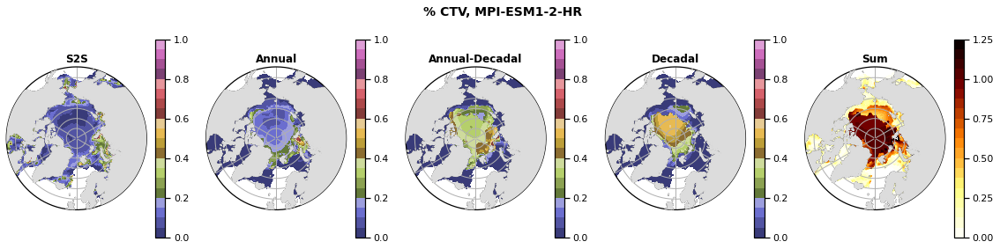

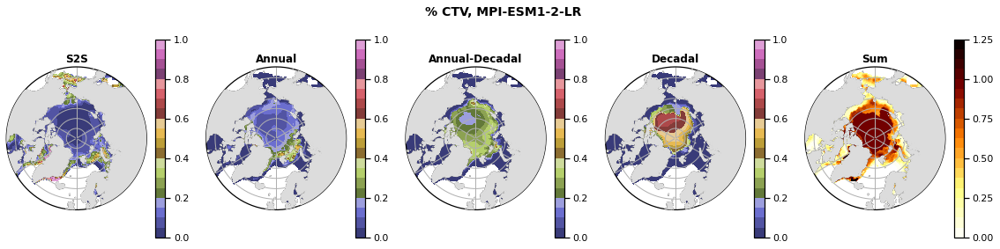

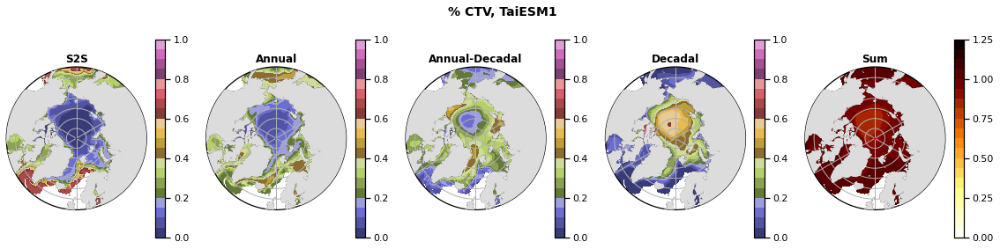

In [23]:
means = []
count = 0 
for case in case_list: 
    
    fig, axes = plt.subplots(1, 5, figsize=(16, 4), subplot_kw={'projection': ccrs.NorthPolarStereo()})
    nps = ccrs.NorthPolarStereo()
    
    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()
    
    
    decadal_filtered = xr.apply_ufunc(partial(signal.sosfilt, decadal_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    ann2dec_filtered = xr.apply_ufunc(partial(signal.sosfilt, ann2dec_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    annual_filtered = xr.apply_ufunc(partial(signal.sosfilt, annual_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    s2s_filtered = xr.apply_ufunc(partial(signal.sosfilt, s2s_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    
    ratio_s2s = s2s_filtered.var(dim='time')/anomalies.var(dim='time')
    ratio_ann = annual_filtered.var(dim='time')/anomalies.var(dim='time')
    ratio_a2d = ann2dec_filtered.var(dim='time')/anomalies.var(dim='time')
    ratio_dec = decadal_filtered.var(dim='time')/anomalies.var(dim='time')
    ratio_sum = ratio_s2s + ratio_ann + ratio_a2d + ratio_dec

    ratios = {'s2s':ratio_s2s, 'ann':ratio_ann, 'a2d':ratio_a2d, 'dec':ratio_dec, 'sum':ratio_sum}
    tags = ['s2s','ann','a2d','dec', 'sum']
    titles = ['S2S', 'Annual', 'Annual-Decadal', 'Decadal', 'Sum']

    for i in range(0, 5):
        fashion_space(axes[i])
        xs, ys, data_to_plot = convert_coords(s2s_filtered.lat, s2s_filtered.lon, ratios[tags[i]], ccrs.NorthPolarStereo())
        if i == 4:
            cmap = plt.cm.afmhot_r
            clevs_label = np.linspace(0, 1.25, 6)
            clevs = np.linspace(0, 1.25, 21)
        else:
            cmap = plt.cm.tab20b
            clevs_label = np.linspace(0, 1, 6)
            clevs = np.linspace(0, 1, 21)
        img = axes[i].contourf(xs, ys, data_to_plot, clevs, transform=ccrs.NorthPolarStereo(), cmap=cmap)
        cbar2 = fig.colorbar(img, ax=axes[i], ticks= clevs_label)
        axes[i].set_title(titles[i], fontweight='bold', fontsize=12)

    plt.suptitle('% CTV, ' + case, fontsize=14, fontweight='bold')
    plt.tight_layout()
    
    ratios = [ratio_s2s.mean(dim=['x','y']), 
              ratio_ann.mean(dim=['x','y']), 
              ratio_a2d.mean(dim=['x','y']), 
              ratio_dec.mean(dim=['x','y'])
             ]
    
    means.append(ratios)
    
    count += 1

means = np.array(means)

### Pan-Arctic Timeseries of Filtered Model Anomalies

/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.p

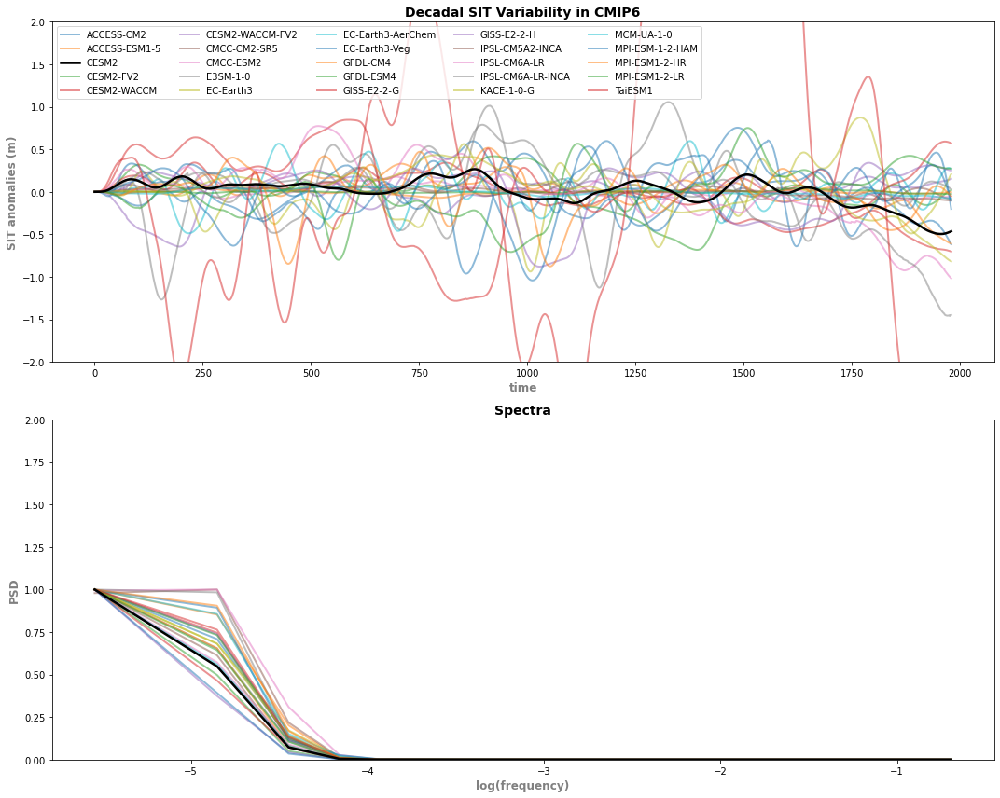

In [16]:
count = 0
fig, axes = plt.subplots(nrows = 2, figsize=(15, 12))

for case in case_list:

    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()

    decadal_filtered = xr.apply_ufunc(partial(signal.sosfilt, decadal_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    dec_freq, dec_PSD = signal.welch(decadal_filtered.mean(dim=['x', 'y']),
                                     fs=1,
                                     window='hann',
                                     nperseg=256,
                                     detrend='linear',
                                     axis=0
                                     )
    if case_list[count] == 'CESM2':
        axes[0].plot(decadal_filtered.mean(dim=['x', 'y']), linewidth=2.5, color = 'black', label=case_list[count], zorder=25)
        axes[1].plot(np.log(dec_freq), dec_PSD/max(dec_PSD), linewidth=2.5, color = 'black', label=case_list[count], zorder=25)
    else:
        with sns.color_palette("Spectral", n_colors=24):
            axes[0].plot(decadal_filtered.mean(dim=['x', 'y']), alpha=0.5, linewidth=2, label=case_list[count])
        with sns.color_palette("Spectral", n_colors=24):
            axes[1].plot(np.log(dec_freq), dec_PSD/max(dec_PSD), alpha=0.5, linewidth=2, label=case_list[count])
            
    count += 1

axes[0].set_ylim([-2, 2])
axes[0].set_xlabel('time', fontweight='bold', fontsize=12, c = 'grey')
axes[0].set_ylabel('SIT anomalies (m)', fontweight='bold', fontsize=12, c = 'grey')
axes[0].set_title('Decadal SIT Variability in CMIP6', fontweight='bold', fontsize=14)
axes[0].legend(ncol=5)

axes[1].set_ylim([0, 2])
axes[1].set_xlabel('log(frequency)', fontweight='bold', fontsize=12, c = 'grey')
axes[1].set_ylabel('PSD', fontweight='bold', fontsize=12, c = 'grey')
axes[1].set_title('Spectra', fontweight='bold', fontsize=14)

plt.tight_layout()

/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.p

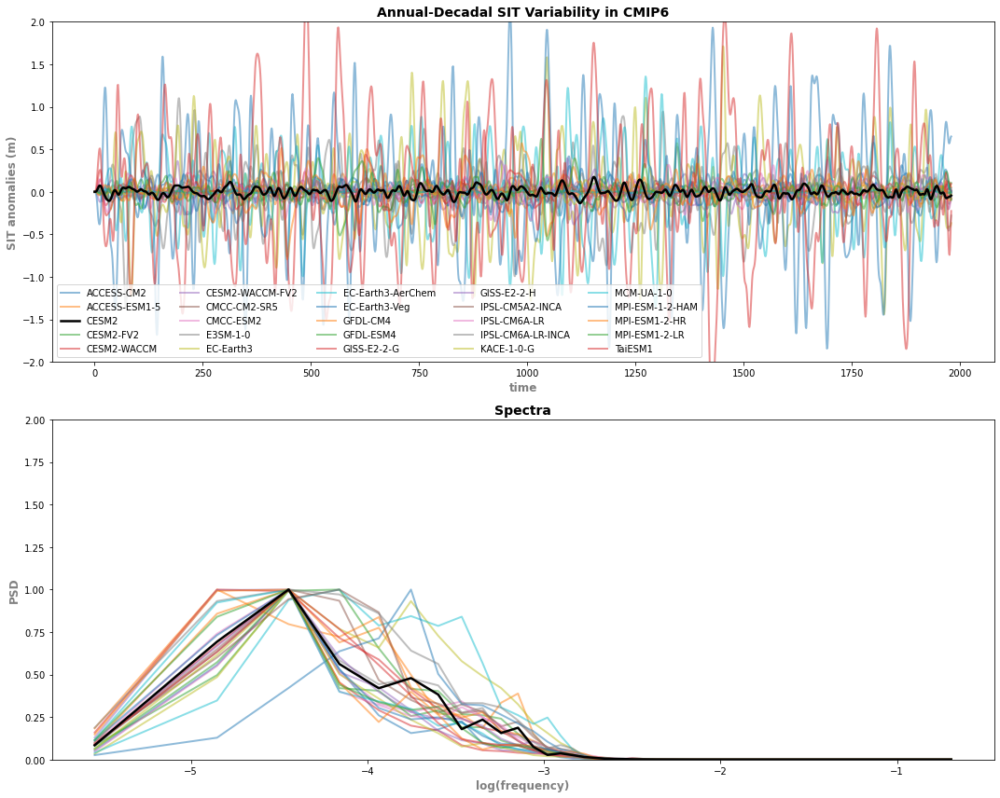

In [17]:
count = 0
fig, axes = plt.subplots(nrows = 2, figsize=(15, 12))

for case in case_list:

    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()

    ann2dec_filtered = xr.apply_ufunc(partial(signal.sosfilt, ann2dec_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    a2d_freq, a2d_PSD = signal.welch(ann2dec_filtered.mean(dim=['x', 'y']),
                                     fs=1,
                                     window='hann',
                                     nperseg=256,
                                     detrend=False,
                                     axis=0
                                     )
    if case_list[count] == 'CESM2':
        axes[0].plot(ann2dec_filtered.mean(dim=['x', 'y']), linewidth=2.5, color = 'black', label=case_list[count], zorder=25)
        axes[1].plot(np.log(a2d_freq), a2d_PSD/max(a2d_PSD), linewidth=2.5, color = 'black', label=case_list[count], zorder=25)
    else:
        with sns.color_palette("Spectral", n_colors=24):
            axes[0].plot(ann2dec_filtered.mean(dim=['x', 'y']), alpha=0.5, linewidth=2, label=case_list[count])
        with sns.color_palette("Spectral", n_colors=24):
            axes[1].plot(np.log(a2d_freq), a2d_PSD/max(a2d_PSD), alpha=0.5, linewidth=2, label=case_list[count])
    count += 1

axes[0].set_ylim([-2, 2])
axes[1].set_ylim([0, 2])
axes[0].set_xlabel('time', fontweight='bold', fontsize=12, c = 'grey')
axes[0].set_ylabel('SIT anomalies (m)', fontweight='bold', fontsize=12, c = 'grey')
axes[0].set_title('Annual-Decadal SIT Variability in CMIP6', fontweight='bold', fontsize=14)
axes[0].legend(ncol=5)

axes[1].set_ylim([0, 2])
axes[1].set_xlabel('log(frequency)', fontweight='bold', fontsize=12, c = 'grey')
axes[1].set_ylabel('PSD', fontweight='bold', fontsize=12, c = 'grey')
axes[1].set_title('Spectra', fontweight='bold', fontsize=14)

plt.tight_layout()

/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.p

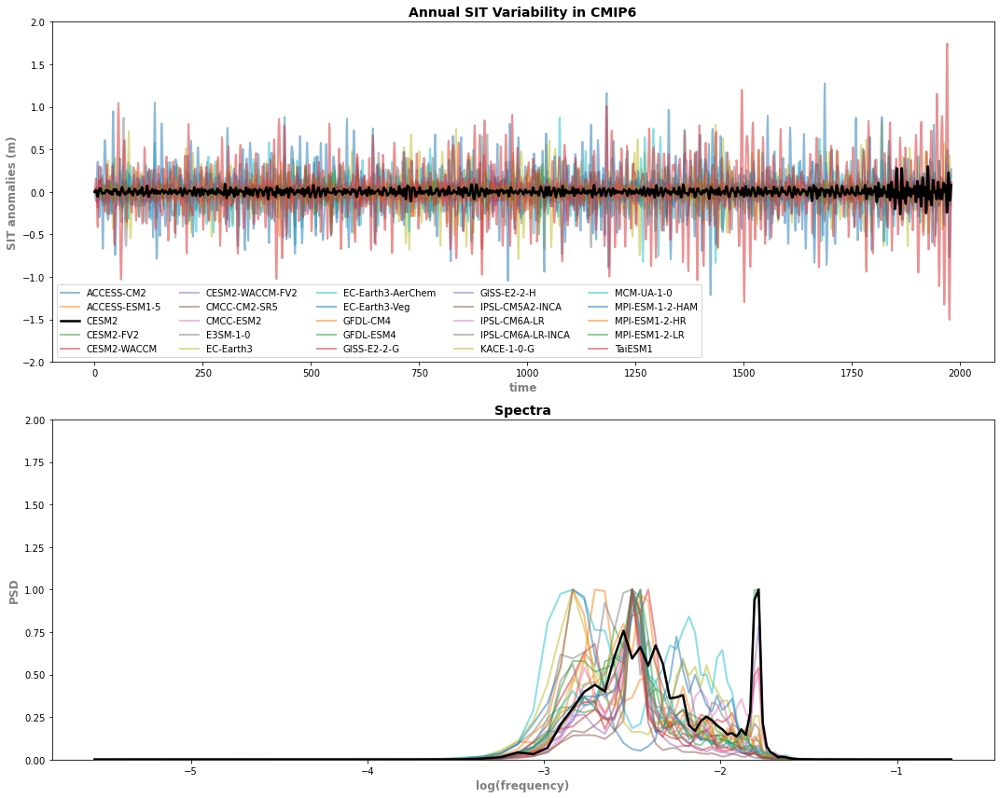

In [14]:
count = 0
fig, axes = plt.subplots(nrows = 2, figsize=(15, 12))

for case in case_list:

    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()

    annual_filtered = xr.apply_ufunc(partial(signal.sosfilt, annual_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    ann_freq, ann_PSD = signal.welch(annual_filtered.mean(dim=['x', 'y']),
                                     fs=1,
                                     window='hann',
                                     nperseg= 256,
                                     detrend=False,
                                     axis=0
                                     )
    if case_list[count] == 'CESM2':
        axes[0].plot(annual_filtered.mean(dim=['x', 'y']), linewidth=2.5, color = 'black', label=case_list[count], zorder=25)
        axes[1].plot(np.log(ann_freq), ann_PSD/max(ann_PSD), linewidth=2.5, color = 'black', label=case_list[count], zorder=25)
    else:
        with sns.color_palette("Spectral", n_colors=24):
            axes[0].plot(annual_filtered.mean(dim=['x', 'y']), alpha=0.5, linewidth=2, label=case_list[count])
        with sns.color_palette("Spectral", n_colors=24):
            axes[1].plot(np.log(ann_freq), ann_PSD/max(ann_PSD), alpha=0.5, linewidth=2, label=case_list[count])
            
    count += 1

axes[0].set_ylim([-2, 2])
axes[0].set_xlabel('time', fontweight='bold', fontsize=12, c = 'grey')
axes[0].set_ylabel('SIT anomalies (m)', fontweight='bold', fontsize=12, c = 'grey')
axes[0].set_title('Annual SIT Variability in CMIP6', fontweight='bold', fontsize=14)
axes[0].legend(ncol=5)

axes[1].set_ylim([0, 2])
axes[1].set_xlabel('log(frequency)', fontweight='bold', fontsize=12, c = 'grey')
axes[1].set_ylabel('PSD', fontweight='bold', fontsize=12, c = 'grey')
axes[1].set_title('Spectra', fontweight='bold', fontsize=14)

plt.tight_layout()

/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/ipykernel_launcher.p

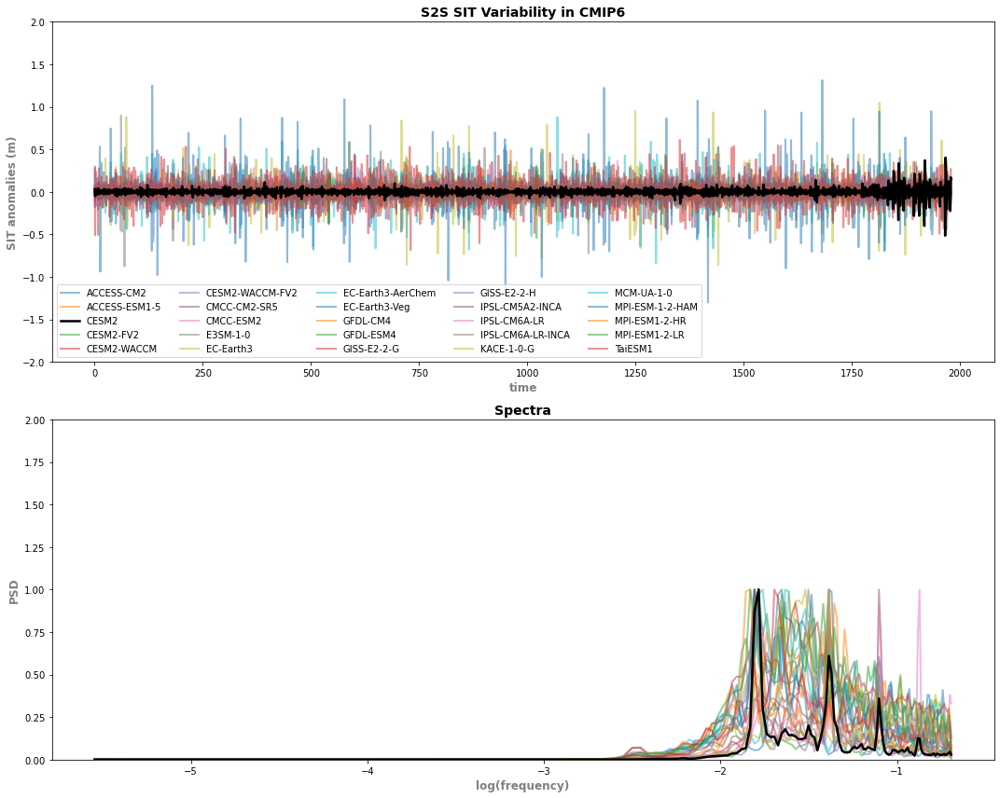

In [15]:
count = 0
fig, axes = plt.subplots(nrows = 2, figsize=(15, 12))

for case in case_list:

    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()

    s2s_filtered = xr.apply_ufunc(partial(signal.sosfilt, s2s_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    s2s_freq, s2s_PSD = signal.welch(s2s_filtered.mean(dim=['x','y']),
                                     fs=1,
                                     window='hann',
                                     nperseg=256,
                                     detrend=False,
                                     axis=0
                                     )
    
    if case_list[count] == 'CESM2':
        axes[0].plot(s2s_filtered.mean(dim=['x', 'y']), linewidth=2.5, color = 'black', label=case_list[count], zorder=25)
        axes[1].plot(np.log(s2s_freq), s2s_PSD/max(s2s_PSD), linewidth=2.5, color = 'black', label=case_list[count], zorder=25)
    else:
        with sns.color_palette("Spectral", n_colors=24):
            axes[0].plot(s2s_filtered.mean(dim=['x', 'y']), alpha=0.5, linewidth=2, label=case_list[count])
        with sns.color_palette("Spectral", n_colors=24):
            axes[1].plot(np.log(s2s_freq), s2s_PSD/max(s2s_PSD), alpha=0.5, linewidth=2, label=case_list[count])

    count += 1

axes[0].set_ylim([-2, 2])
axes[0].set_xlabel('time', fontweight='bold', fontsize=12, c = 'grey')
axes[0].set_ylabel('SIT anomalies (m)', fontweight='bold', fontsize=12, c = 'grey')
axes[0].set_title('S2S SIT Variability in CMIP6', fontweight='bold', fontsize=14)
axes[0].legend(ncol=5)

axes[1].set_ylim([0, 2])
axes[1].set_xlabel('log(frequency)', fontweight='bold', fontsize=12, c = 'grey')
axes[1].set_ylabel('PSD', fontweight='bold', fontsize=12, c = 'grey')
axes[1].set_title('Spectra', fontweight='bold', fontsize=14)

plt.tight_layout()

### Model Damping Timescales

/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: invalid value encountered in log
  res

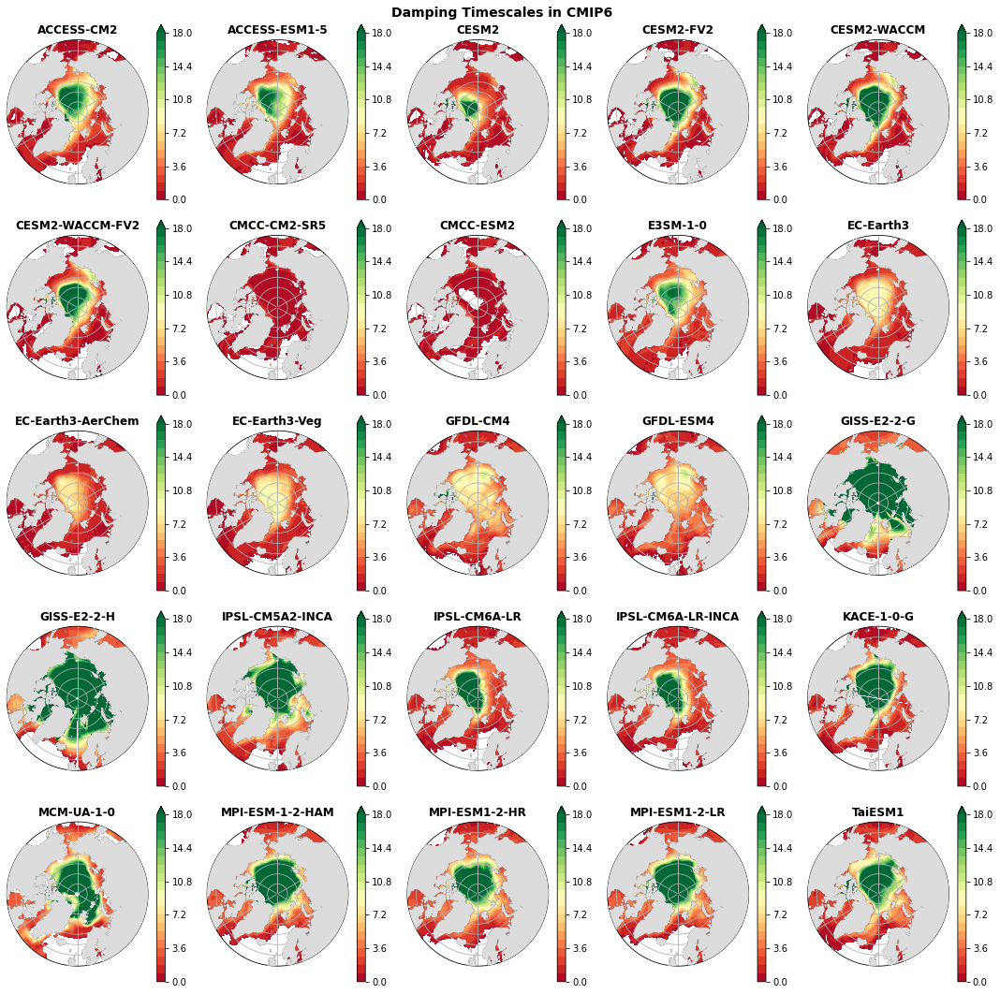

In [9]:
count = 0
count1 = 0
count2 = 0

fig, axes = plt.subplots(nrows=5, ncols=5,
                         figsize=(15, 15),
                         subplot_kw={'projection': ccrs.NorthPolarStereo()})
for case in case_list: 
    
    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()
    
    h_prime, auto, damp, external = markov_2(anomalies, 2, 1)
    
    ax = axes[count1][count2]
    fashion_space(ax)

    upper = 18

    xs, ys, data_to_plot = convert_coords(damp.lat, damp.lon, 1/damp, ccrs.NorthPolarStereo())
    cmap = plt.cm.RdYlGn
    clevs_label = np.linspace(0, upper, 6)
    clevs = np.linspace(0, upper, 21)
    img = ax.contourf(xs, ys, data_to_plot, clevs, transform=ccrs.NorthPolarStereo(), cmap=cmap, extend = 'max')
    cbar2 = fig.colorbar(img, ax=ax, ticks= clevs_label)
    ax.set_title(case, fontweight='bold', fontsize=12)

    count += 1
    count2 += 1
    if count2 > 4:
        count2 = 0
        count1 += 1

plt.suptitle('Damping Timescales in CMIP6', fontweight='bold', fontsize=14)
plt.tight_layout()
    

### Quadratic Thickness Dependence?

I don't think I should need to area weight the h_eff per grid cell... because it's already technically area weighted. 

If 
$ V = h * c * area$,

calculating $h_{eff}$ is then

$h_{eff} = \frac{V}{area} = h * c$

/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: invalid value encountered in log
  res

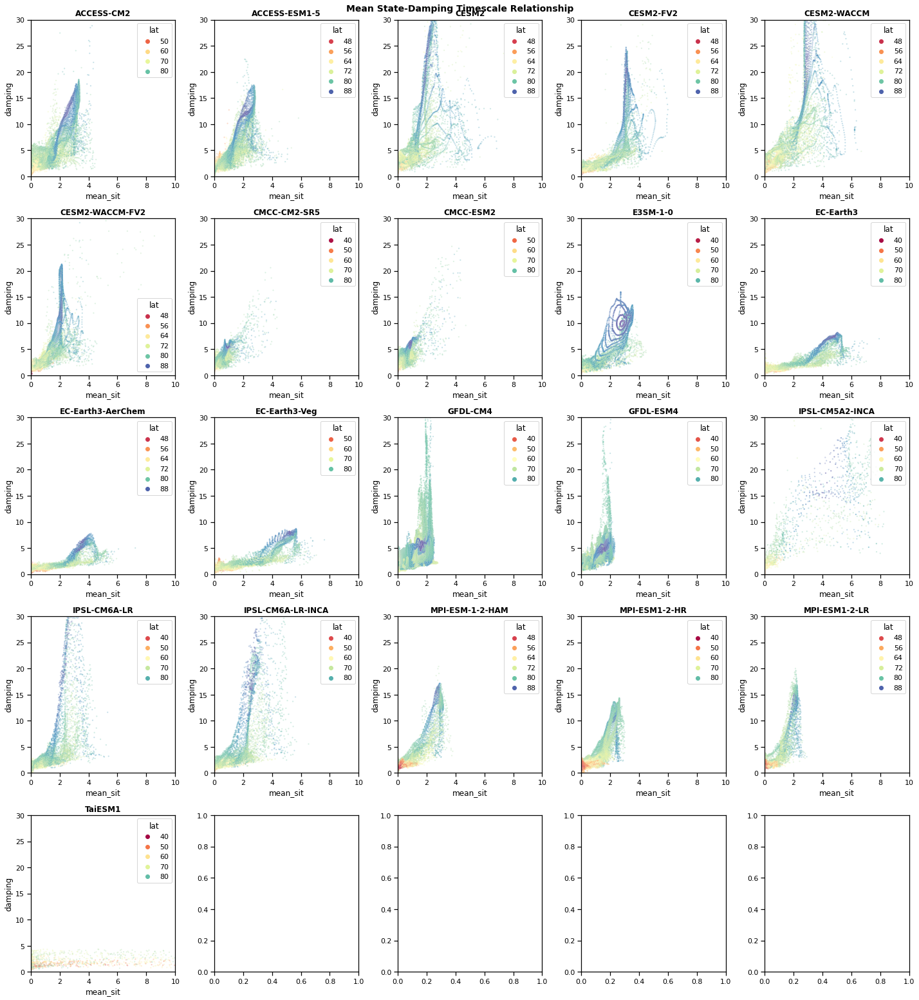

In [13]:
count = 0
count1 = 0
count2 = 0

sns.set_context("notebook")

fig, axes = plt.subplots(nrows=5, ncols=5,
                         figsize=(20,22))

for case in case_list:
    ax = axes[count1][count2]
    
    # get the data 
    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()
    
    h_prime, auto, damp, external = markov_2(anomalies, 2, 1)
    mean_sit = data[0:5*12+1, :, :].mean(dim='time')
    
    sns_xr = xr.Dataset(data_vars=dict(mean_sit=(["x", "y"], mean_sit),
                                       damping=(["x", "y", ], 1/damp),
                                      ),
                        coords=dict(lon=(["x", "y"], damp.lon),
                                    lat=(["x", "y"], damp.lat),
                                   ),
                       )
    
    sns_Data = sns_xr.to_dataframe()
    
    ilt = sns.scatterplot(data = sns_Data.where(sns_Data.lat>0).dropna(), x = 'mean_sit', y = 'damping', hue = 'lat',
                    palette = 'Spectral', ax=ax, alpha = 0.3,
                    edgecolors=None, s = 5)
    ax.set_title(case, fontweight='bold', fontsize=12)
    ax.set_ylim([0,30])
    ax.set_xlim([0,10])
    
    # ax.set_ylabel('damping timescale (months)')
    # ax.set_xlabel('inital mean SIT')
    
    count += 1
    count2 += 1
    if count2 > 4:
        count2 = 0
        count1 += 1
    
plt.suptitle('Mean State-Damping Timescale Relationship', fontsize=14, fontweight='bold') 
plt.tight_layout()

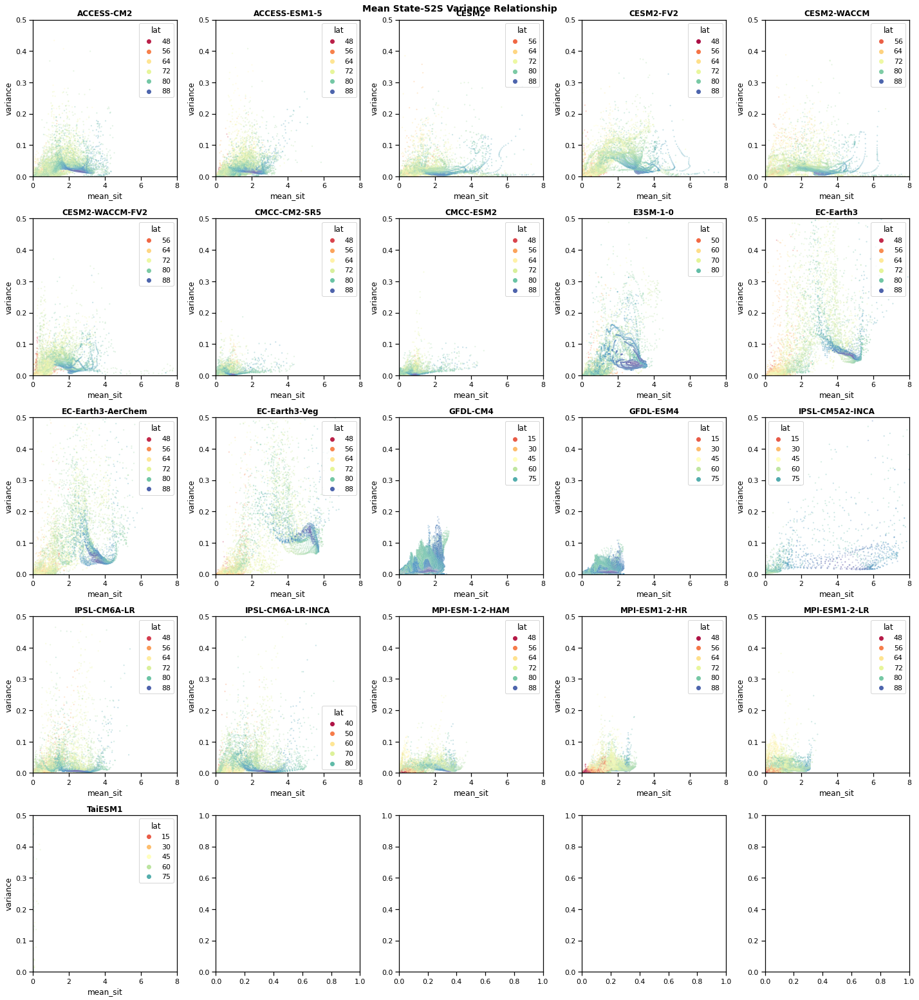

In [22]:
count = 0
count1 = 0
count2 = 0

sns.set_context("notebook")

fig, axes = plt.subplots(nrows=5, ncols=5,
                         figsize=(20,22))

for case in case_list:
    ax = axes[count1][count2]
    
    # get the data 
    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()
    
    s2s_filtered = xr.apply_ufunc(partial(signal.sosfilt, s2s_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    mean_sit = data[0:5*12+1, :, :].mean(dim='time')
    
    sns_xr = xr.Dataset(data_vars=dict(mean_sit=(["x", "y"], mean_sit),
                                       variance=(["x", "y", ], s2s_filtered.var(dim='time')),
                                      ),
                        coords=dict(lon=(["x", "y"], s2s_filtered.lon),
                                    lat=(["x", "y"], s2s_filtered.lat),
                                   ),
                       )
    
    sns_Data = sns_xr.to_dataframe()
    
    ilt = sns.scatterplot(data = sns_Data.where(sns_Data.lat>0).dropna(), x = 'mean_sit', y = 'variance', hue = 'lat',
                    palette = 'Spectral', ax=ax, alpha = 0.3,
                    edgecolors=None, s = 5)
    ax.set_title(case, fontweight='bold', fontsize=12)
    ax.set_ylim([0,0.5])
    ax.set_xlim([0,8])
    
    # ax.set_ylabel('damping timescale (months)')
    # ax.set_xlabel('inital mean SIT')
    
    count += 1
    count2 += 1
    if count2 > 4:
        count2 = 0
        count1 += 1
    
plt.suptitle('Mean State-S2S Variance Relationship', fontsize=14, fontweight='bold') 
plt.tight_layout()

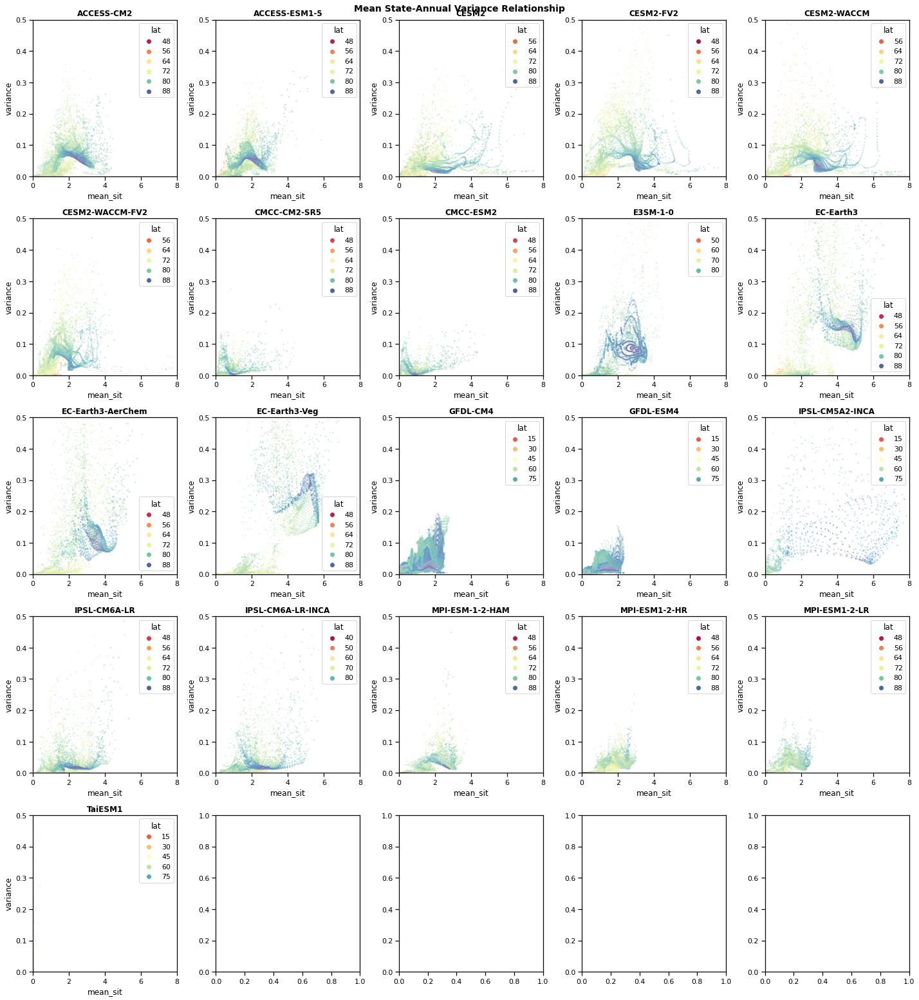

In [18]:
count = 0
count1 = 0
count2 = 0

sns.set_context("notebook")

fig, axes = plt.subplots(nrows=5, ncols=5,
                         figsize=(20,22))

for case in case_list:
    ax = axes[count1][count2]
    
    # get the data 
    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()
    
    ann_filtered = xr.apply_ufunc(partial(signal.sosfilt, annual_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    mean_sit = data[0:5*12+1, :, :].mean(dim='time')
    
    sns_xr = xr.Dataset(data_vars=dict(mean_sit=(["x", "y"], mean_sit),
                                       variance=(["x", "y", ], ann_filtered.var(dim='time')),
                                      ),
                        coords=dict(lon=(["x", "y"], ann_filtered.lon),
                                    lat=(["x", "y"], ann_filtered.lat),
                                   ),
                       )
    
    sns_Data = sns_xr.to_dataframe()
    
    ilt = sns.scatterplot(data = sns_Data.where(sns_Data.lat>0).dropna(), x = 'mean_sit', y = 'variance', hue = 'lat',
                    palette = 'Spectral', ax=ax, alpha = 0.3,
                    edgecolors=None, s = 5)
    ax.set_title(case, fontweight='bold', fontsize=12)
    ax.set_ylim([0,0.5])
    ax.set_xlim([0,8])
    
    # ax.set_ylabel('damping timescale (months)')
    # ax.set_xlabel('inital mean SIT')
    
    count += 1
    count2 += 1
    if count2 > 4:
        count2 = 0
        count1 += 1
    
plt.suptitle('Mean State-Annual Variance Relationship', fontsize=14, fontweight='bold') 
plt.tight_layout()

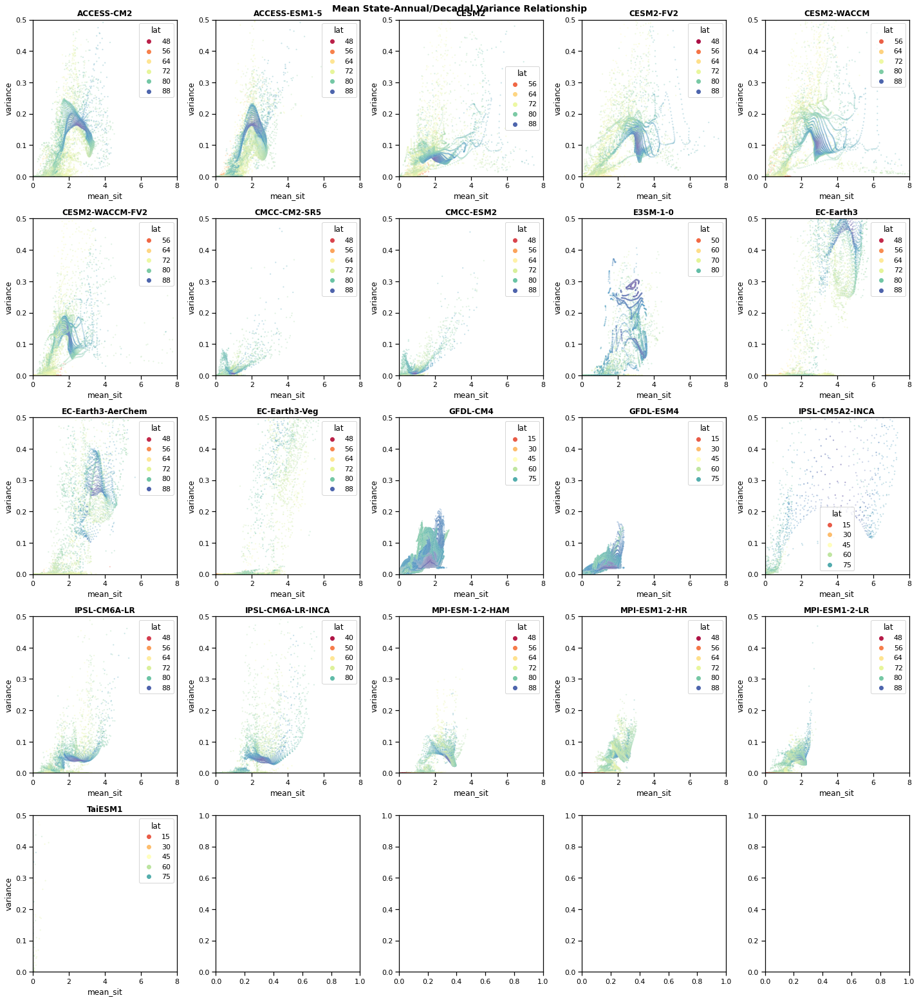

In [20]:
count = 0
count1 = 0
count2 = 0

sns.set_context("notebook")

fig, axes = plt.subplots(nrows=5, ncols=5,
                         figsize=(20,22))

for case in case_list:
    ax = axes[count1][count2]
    
    # get the data 
    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()
    
    a2d_filtered = xr.apply_ufunc(partial(signal.sosfilt, ann2dec_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    mean_sit = data[0:5*12+1, :, :].mean(dim='time')
    
    sns_xr = xr.Dataset(data_vars=dict(mean_sit=(["x", "y"], mean_sit),
                                       variance=(["x", "y", ], a2d_filtered.var(dim='time')),
                                      ),
                        coords=dict(lon=(["x", "y"], a2d_filtered.lon),
                                    lat=(["x", "y"], a2d_filtered.lat),
                                   ),
                       )
    
    sns_Data = sns_xr.to_dataframe()
    
    ilt = sns.scatterplot(data = sns_Data.where(sns_Data.lat>0).dropna(), x = 'mean_sit', y = 'variance', hue = 'lat',
                    palette = 'Spectral', ax=ax, alpha = 0.3,
                    edgecolors=None, s = 5)
    ax.set_title(case, fontweight='bold', fontsize=12)
    ax.set_ylim([0,0.5])
    ax.set_xlim([0,8])
    
    # ax.set_ylabel('damping timescale (months)')
    # ax.set_xlabel('inital mean SIT')
    
    count += 1
    count2 += 1
    if count2 > 4:
        count2 = 0
        count1 += 1
    
plt.suptitle('Mean State-Annual/Decadal Variance Relationship', fontsize=14, fontweight='bold') 
plt.tight_layout()

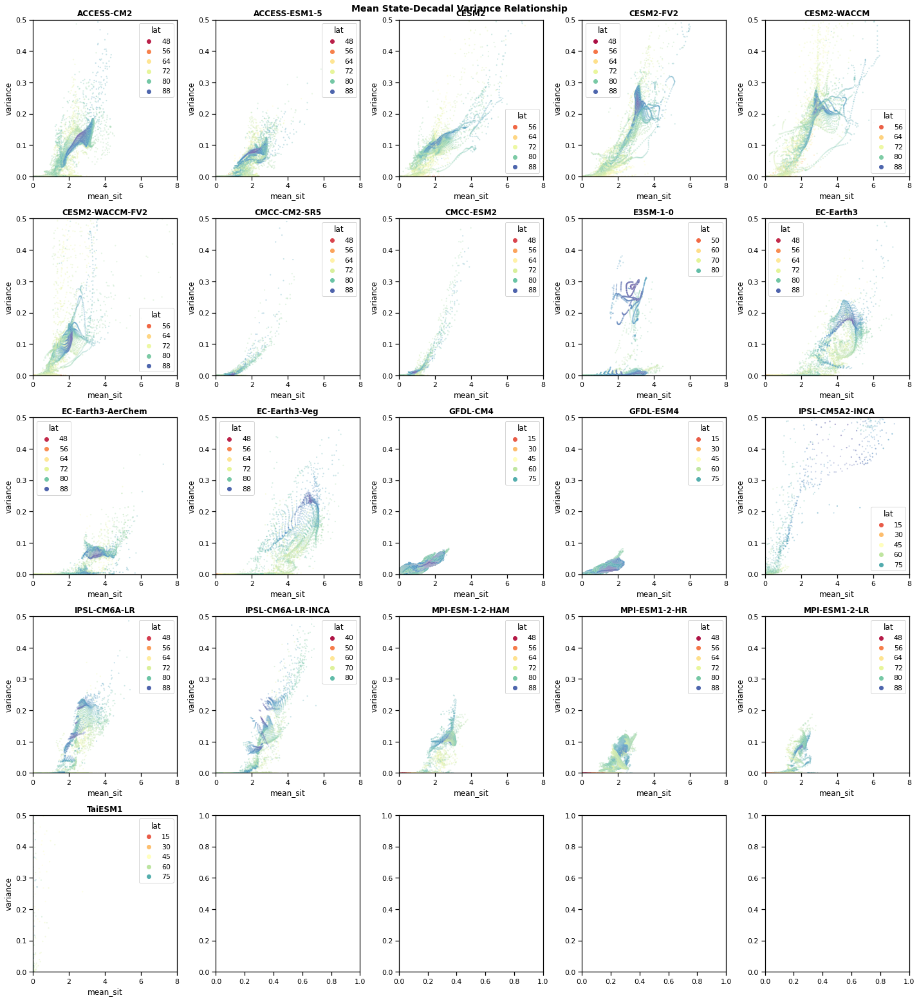

In [21]:
count = 0
count1 = 0
count2 = 0

sns.set_context("notebook")

fig, axes = plt.subplots(nrows=5, ncols=5,
                         figsize=(20,22))

for case in case_list:
    ax = axes[count1][count2]
    
    # get the data 
    data = data_list[count].thickness
    anomalies = get_monthly_anomalies(data)
    anomalies.load()
    
    a2d_filtered = xr.apply_ufunc(partial(signal.sosfilt, decadal_sos),
                                  anomalies,
                                  # dask='parallelized',
                                  output_dtypes=[anomalies.dtype],
                                  kwargs={'axis': 0})
    
    mean_sit = data[0:5*12+1, :, :].mean(dim='time')
    
    sns_xr = xr.Dataset(data_vars=dict(mean_sit=(["x", "y"], mean_sit),
                                       variance=(["x", "y", ], a2d_filtered.var(dim='time')),
                                      ),
                        coords=dict(lon=(["x", "y"], a2d_filtered.lon),
                                    lat=(["x", "y"], a2d_filtered.lat),
                                   ),
                       )
    
    sns_Data = sns_xr.to_dataframe()
    
    ilt = sns.scatterplot(data = sns_Data.where(sns_Data.lat>0).dropna(), x = 'mean_sit', y = 'variance', hue = 'lat',
                    palette = 'Spectral', ax=ax, alpha = 0.3,
                    edgecolors=None, s = 5)
    ax.set_title(case, fontweight='bold', fontsize=12)
    ax.set_ylim([0,0.5])
    ax.set_xlim([0,8])
    
    # ax.set_ylabel('damping timescale (months)')
    # ax.set_xlabel('inital mean SIT')
    
    count += 1
    count2 += 1
    if count2 > 4:
        count2 = 0
        count1 += 1
    
plt.suptitle('Mean State-Decadal Variance Relationship', fontsize=14, fontweight='bold') 
plt.tight_layout()

## Discussion

## Conclusions

In [33]:
sns_Data.where(sns_Data.lat>0).dropna()

mean_sit     damping         lon        lat
x   y                                                 
287 163    0.000000    0.251437  144.000397  39.390167
    164    0.000000    0.243590  145.143311  39.385670
    165    0.000000    0.342754  146.286179  39.380058
288 162    0.000000    1.442769  142.860077  40.015934
    163    0.000000    0.892671  144.004074  40.012459
...             ...         ...         ...        ...
382 87   708.752686  165.362862  338.875702  78.286407
    270   85.713074    2.534347  302.288208  74.970695
    271   78.570473    2.554100  302.469910  74.873596
    272   77.397224    2.430062  302.659943  74.776535
    273   78.665894    2.222597  302.858337  74.679558

[10272 rows x 4 columns]

## Old Preprocessing Code

In [4]:
case_list = ["ACCESS-CM2",
             "ACCESS-ESM1-5",
             # "AWI-CM-1-1-MR",
             # "AWI-ESM-1-1-LR",
             "CESM2",
             "CESM2-FV2",
             "CESM2-WACCM",
             "CESM2-WACCM-FV2",
             "CMCC-CM2-SR5",
             "CMCC-ESM2",
             "E3SM-1-0",
             "EC-Earth3",
             "EC-Earth3-AerChem",
             "EC-Earth3-Veg",
             "GFDL-CM4",
             "GFDL-ESM4",
             # "GISS-E2-2-G",
             # "GISS-E2-2-H",
             # "ICON-ESM-LR",
             "IPSL-CM5A2-INCA",
             "IPSL-CM6A-LR",
             "IPSL-CM6A-LR-INCA",
             # "KACE-1-0-G",
             # "MCM-UA-1-0",
             "MPI-ESM-1-2-HAM",
             "MPI-ESM1-2-HR",
             "MPI-ESM1-2-LR",
             "TaiESM1"
            ]

latitudes = ["latitude",
             "latitude",
             # "lat",
             # "lat",
             "lat",
             "lat",
             "lat",
             "lat",
             "latitude",
             "latitude",
             "lat",
             "latitude",
             "latitude",
             "latitude",
             "lat",
             "lat",
             # "lat",
             # "lat",
             # "latitude",
             "nav_lat",
             "nav_lat",
             "nav_lat",
             # "latitude",
             # "latitude",
             "latitude",
             "latitude",
             "latitude",
             "latitude",
            ]

longitudes = ["longitude",
             "longitude",
             # "lon",
             # "lon",
             "lon",
             "lon",
             "lon",
             "lon",
             "longitude",
             "longitude",
             "lon",
             "longitude",
             "longitude",
             "longitude",
             "lon",
             "lon",
             # "lon",
             # "lon",
             # "longitude",
             "nav_lon",
             "nav_lon",
             "nav_lon",
             # "longitude",
             # "longitude",
             "longitude",
             "longitude",
             "longitude",
             "longitude",
            ]

vertices_lat = ['vertices_latitude',
                'vertices_latitude',
                'lat_bnds',
                'lat_bnds',
                'lat_bnds',
                'lat_bnds',
                'vertices_latitude',
                'vertices_latitude',
                'lat_bnds',
                'vertices_latitude',
                'vertices_latitude',
                'vertices_latitude',
                'lat_bnds',
                'lat_bnds',
                'bounds_nav_lat',
                'bounds_nav_lat',
                'bounds_nav_lat',
                # 'vertices_latitude',
                # 'vertices_latitude',
                'vertices_latitude',
                'vertices_latitude',
                'vertices_latitude',
                'vertices_latitude',
                ]
vertices_lon = ['vertices_longitude',
                'vertices_longitude',
                'lon_bnds',
                'lon_bnds',
                'lon_bnds',
                'lon_bnds',
                'vertices_longitude',
                'vertices_longitude',
                'lon_bnds',
                'vertices_longitude',
                'vertices_longitude',
                'vertices_longitude',
                'lon_bnds',
                'lon_bnds',
                'bounds_nav_lon',
                'bounds_nav_lon',
                'bounds_nav_lon',
                # 'vertices_longitude',
                # 'vertices_longitude',
                'vertices_longitude',
                'vertices_longitude',
                'vertices_longitude',
                'vertices_longitude',
                ]

In [5]:
pwd = '/glade/work/mollyw/Projects/sit_variability/cmip6/data/'
paths = [pwd + 'v_sithick_f_mon_e_historical_s_' + case +'_vl_r1i1p1f1/' for case in case_list]
paths_sic = [pwd + 'v_siconc_f_mon_e_historical_s_' + case +'_vl_r1i1p1f1/' for case in case_list]

In [7]:
data_list = []
count = 0
for path in paths:
    # print(path)
    files = glob.glob(path + 'sithick_SImon_*.nc')
    sic_files = glob.glob(paths_sic[count] + 'siconc_SImon_*.nc')
    
    if len(files) == 1:
        ds_sit = xr.open_dataset(files[0])
    if len(sic_files) == 1:
        ds_sic = xr.open_dataset(sic_files[0])
    else:
        ds_sit = xr.open_mfdataset(files, combine='nested', concat_dim='time')
        ds_sic = xr.open_mfdataset(sic_files, combine='nested', concat_dim='time')

    new_latitude = ds_sit[latitudes[count]]
    new_longitude = ds_sit[longitudes[count]]
    
    sit = ds_sit.sithick.values
    sic = ds_sic.siconc.values/100
    
#     if np.shape(ds_sit[vertices_lat[count]])[-1] < 4:
#         lats, lons = np.meshgrid(ds_sit[vertices_lat[count]][0,:,0], ds_sit[vertices_lon[count]][0,:,0])
#         corner1 = [(i,j) for i,j in zip(np.ravel(lats), np.ravel(lons))]
#         lats, lons = np.meshgrid(ds_sit[vertices_lat[count]][0,:,0], ds_sit[vertices_lon[count]][0,:,1])
#         corner2 = [(i,j) for i,j in zip(np.ravel(lats), np.ravel(lons))]
#         lats, lons = np.meshgrid(ds_sit[vertices_lat[count]][0,:,1], ds_sit[vertices_lon[count]][0,:,1])
#         corner3 = [(i,j) for i,j in zip(np.ravel(lats), np.ravel(lons))]
#         lats, lons = np.meshgrid(ds_sit[vertices_lat[count]][0,:,1], ds_sit[vertices_lon[count]][0,:,0])
#         corner4 = [(i,j) for i,j in zip(np.ravel(lats), np.ravel(lons))]
#     elif len(np.shape(ds_sit[vertices_lat[count]])) < 4:
#         corner1 = [(i,j) for i,j in zip(np.ravel(ds_sit[vertices_lat[count]][:,:,0].values), np.ravel(ds_sit[vertices_lon[count]][:,:,0].values))]
#         corner2 = [(i,j) for i,j in zip(np.ravel(ds_sit[vertices_lat[count]][:,:,1].values), np.ravel(ds_sit[vertices_lon[count]][:,:,1].values))]
#         corner3 = [(i,j) for i,j in zip(np.ravel(ds_sit[vertices_lat[count]][:,:,2].values), np.ravel(ds_sit[vertices_lon[count]][:,:,2].values))]
#         corner4 = [(i,j) for i,j in zip(np.ravel(ds_sit[vertices_lat[count]][:,:,3].values), np.ravel(ds_sit[vertices_lon[count]][:,:,3].values))]
#     else: 
#         corner1 = [(i,j) for i,j in zip(np.ravel(ds_sit[vertices_lat[count]][0,:,:,0].values), np.ravel(ds_sit[vertices_lon[count]][0,:,:,0].values))]
#         corner2 = [(i,j) for i,j in zip(np.ravel(ds_sit[vertices_lat[count]][0,:,:,1].values), np.ravel(ds_sit[vertices_lon[count]][0,:,:,1].values))]
#         corner3 = [(i,j) for i,j in zip(np.ravel(ds_sit[vertices_lat[count]][0,:,:,2].values), np.ravel(ds_sit[vertices_lon[count]][0,:,:,2].values))]
#         corner4 = [(i,j) for i,j in zip(np.ravel(ds_sit[vertices_lat[count]][0,:,:,3].values), np.ravel(ds_sit[vertices_lon[count]][0,:,:,3].values))]

#     grid_cells = [Polygon([a, b, c, d]) for a, b, c, d in zip(corner1, corner2, corner3, corner4)]
    
#     cell_data = gpd.GeoDataFrame(grid_cells, columns=['geometry'], crs='epsg:3411')
#     area = np.array(cell_data.area)
    
#     ind = np.where(area > 1)[0]
#     if len(ind) != 0:
#         for ii in ind:
#             area[ii] = (area[ii-2] + area[ii+2])/2
            
#     area[area > 1] = 1 
    
#     if np.shape(ds_sit[vertices_lat[count]])[-1] < 4:
#         big_area = area.reshape(np.shape(ds_sit[vertices_lat[count]])[1],
#                                 np.shape(ds_sit[vertices_lon[count]])[1])
#     elif len(np.shape(ds_sit[vertices_lat[count]])) < 4:
#         area = area.reshape(np.shape(ds_sit[vertices_lat[count]])[0],
#                             np.shape(ds_sit[vertices_lat[count]])[1])
#         big_area = np.dstack([area]*1980)
#         big_area = np.transpose(big_area, (2, 0, 1))
#     else:
#         big_area = area.reshape(np.shape(ds_sit[vertices_lat[count]])[1],
#                                 np.shape(ds_sit[vertices_lat[count]])[2])
    
    data = sit * sic #* big_area
    

    if len(new_latitude.dims) == 1:
        new_longitude, new_latitude = np.meshgrid(new_longitude, new_latitude)

    pared = xr.Dataset(data_vars=dict(thickness=(["time", "x", "y"], data)),
                       coords=dict(lon=(["x", "y"], new_longitude),
                                   lat=(["x", "y"], new_latitude),
                                   time=ds_sit.time),
                       attrs=dict(description="sea ice thickness (CMIP6)",
                                  path = path,
                                  units="m"
                                  )
                       )

    data_list.append(pared)
    print(case_list[count] + " appended!")
    count += 1

ACCESS-CM2 appended!
ACCESS-ESM1-5 appended!


/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/conventions.py:520: SerializationWarning: variable 'sithick' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/conventions.py:520: SerializationWarning: variable 'siconc' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


CESM2 appended!


/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/conventions.py:520: SerializationWarning: variable 'siconc' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


CESM2-FV2 appended!


/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/conventions.py:520: SerializationWarning: variable 'sithick' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,
/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/conventions.py:520: SerializationWarning: variable 'siconc' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


CESM2-WACCM appended!


/glade/u/home/mollyw/.local/lib/python3.7/site-packages/xarray/conventions.py:520: SerializationWarning: variable 'siconc' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


CESM2-WACCM-FV2 appended!
CMCC-CM2-SR5 appended!
CMCC-ESM2 appended!
E3SM-1-0 appended!
EC-Earth3 appended!
EC-Earth3-AerChem appended!
EC-Earth3-Veg appended!
GFDL-CM4 appended!
GFDL-ESM4 appended!
IPSL-CM5A2-INCA appended!
IPSL-CM6A-LR appended!
IPSL-CM6A-LR-INCA appended!
MPI-ESM-1-2-HAM appended!
MPI-ESM1-2-HR appended!
MPI-ESM1-2-LR appended!
TaiESM1 appended!
